In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skimage.segmentation import mark_boundaries
from skimage.metrics import structural_similarity as ssim
import tensorflow as tf
from tensorflow.keras.preprocessing import image_dataset_from_directory
import cv2
from skimage.measure import regionprops

In [2]:
image_size = (256,256)

In [3]:
def read_from_directory(path,clr_mode,subset):
    image_set = image_dataset_from_directory(
        path,
        labels = "inferred",
        label_mode = 'categorical',
        color_mode = clr_mode,
        validation_split = 0.1,
        subset = subset,
        image_size = image_size,
        seed = 1337,
    )
    
    return image_set

In [4]:
training_set = read_from_directory("C:/Users/hp/Desktop/ALL_IDB Dataset/training",
                                  'grayscale','training')

Found 108 files belonging to 3 classes.
Using 98 files for training.


In [5]:
# training_set = image_dataset_from_directory(
#     "C:/Users/hp/Desktop/ALL_IDB Dataset/training",
#     labels = "inferred",
#     label_mode = 'categorical',
#     color_mode = 'grayscale',
#     validation_split = 0.1,
#     subset = 'training',
#     image_size = image_size,
#     seed = 1337,
# )

In [6]:
# testing_set = image_dataset_from_directory(
#     "C:/Users/hp/Desktop/ALL_IDB Dataset/testing",
#     labels = "inferred",
#     label_mode = 'categorical',
#     color_mode = 'grayscale',
#     seed = 1337,
#     image_size = image_size,
# )

In [7]:
training_set_cleaned = []
testing_set_cleaned = []
kernel_size = (5, 5)
training_labels = []
testing_labels = []

In [8]:
def apply_gaussian_blur(image_set):
    cleaned_set=[]
    label_list=[]
    for images, labels in image_set.take(4):
        for i in range(len(images)):
            numpy_image = images[i].numpy()
            blurred_image = cv2.GaussianBlur(numpy_image, kernel_size, 0)
            cleaned_set.append(blurred_image)
            for j,label in enumerate(labels[i].numpy()):
                if label:
                    if j==0:
                        label_list.append('L1')
                    elif j==1:
                        label_list.append('L2')
                    else:
                        label_list.append('L3')
    
    return cleaned_set,label_list

In [9]:
training_set_cleaned,training_labels = apply_gaussian_blur(training_set)
# testing_set_cleaned,testing_labels = apply_gaussian_blur(testing_set)

In [10]:
def convert_to_dataframe(image_set_cleaned,labels):
    return pd.DataFrame({'Image':image_set_cleaned, 'Cancer Stage':labels})

In [11]:
training_set_dict = convert_to_dataframe(training_set_cleaned,training_labels)
# testing_set_dict = convert_to_dataframe(testing_set_cleaned,testing_labels)

In [12]:
def display_all_images(data):
    fig,axes=plt.subplots(14,7,figsize=(60,60))
    axes = axes.flatten()
    for i in range(len(data)):
        axes[i].imshow(data.iloc[i]['Image'])
        axes[i].set_title(data.iloc[i]['Cancer Stage'])

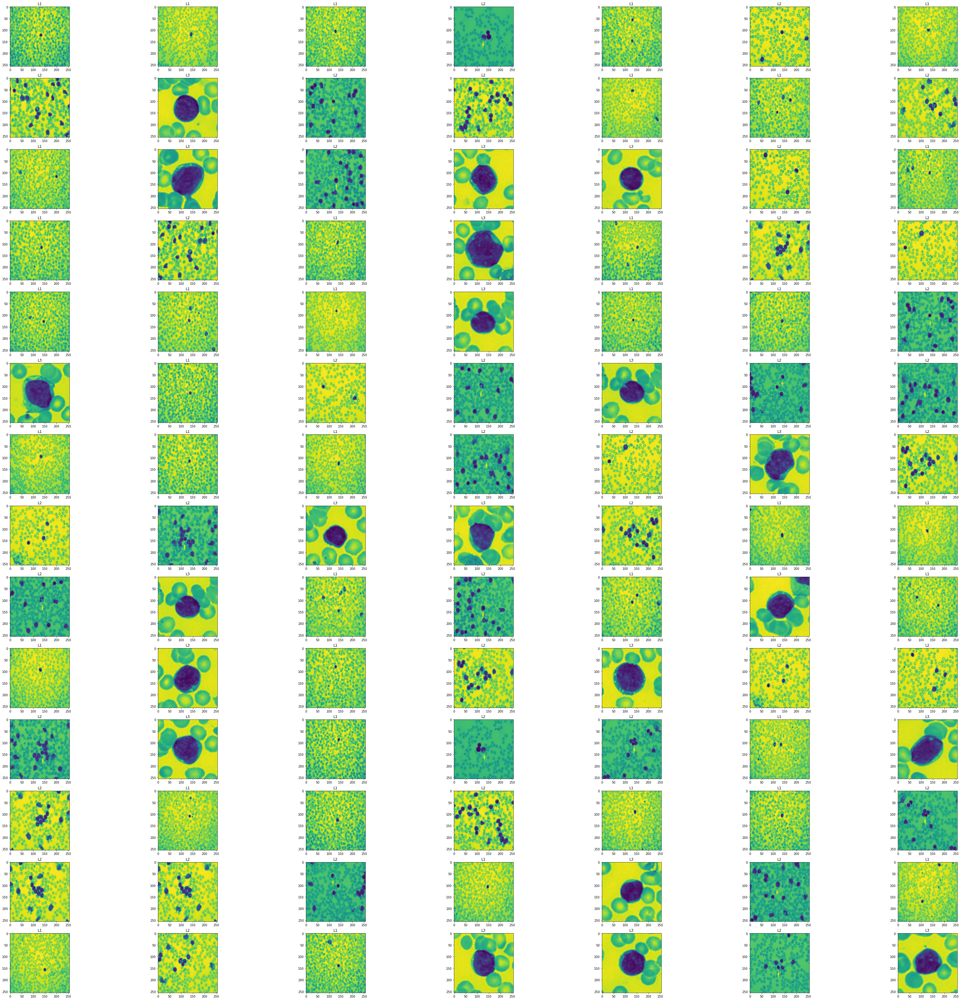

In [13]:
display_all_images(training_set_dict)

In [14]:
def build_segmentation_model(img,clusters):
    flat_image = img.flatten().reshape((-1, 1))
    kmeans = KMeans(n_clusters=clusters, random_state=42)
    kmeans.fit(flat_image)
    labels = kmeans.labels_
    segmented_image = labels.reshape(img.shape)
    return segmented_image

In [15]:
def display_original_and_segmented_image(img,segmented_image):
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    axes[0].imshow(img)
    axes[0].set_title('Original Image')

    axes[1].imshow(segmented_image, cmap='viridis')
    axes[1].set_title('Segmented Image')

    plt.show()

In [16]:
def separate_segmented_image(clusters,image,segmented_image):
    image_segments = []
    for i in range(clusters):
        segment_mask = (segmented_image == i)
        segment = np.zeros_like(image)
        segment[segment_mask] = image[segment_mask]
        image_segments.append(segment)
    
    return image_segments

In [17]:
def display_image_segments(clusters,image_segments):
    fig, axes = plt.subplots(1, clusters, figsize=(30, 30))

    for i in range(clusters):
        axes[i].imshow(image_segments[i])
        axes[i].set_title(f'Segment {i + 1}')

    plt.show()

In [35]:
temp_img_l1=training_set_cleaned[2]
reference_segmented_image_l1=build_segmentation_model(temp_img_l1,6)
reference_image_segments_l1=separate_segmented_image(6,temp_img_l1,reference_segmented_image_l1)
reference_image_l1=reference_image_segments_l1[5]

In [38]:
temp_img_l2=training_set_cleaned[7]
reference_segmented_image_l2=build_segmentation_model(temp_img_l2,4)
reference_image_segments_l2=separate_segmented_image(4,temp_img_l2,reference_segmented_image_l2)
reference_image_l2=reference_image_segments_l2[2]

In [46]:
temp_img_l3=training_set_cleaned[8]
reference_segmented_image_l3=build_segmentation_model(temp_img_l3,4)
reference_image_segments_l3=separate_segmented_image(4,temp_img_l3,reference_segmented_image_l3)
reference_image_l3=reference_image_segments_l3[1]

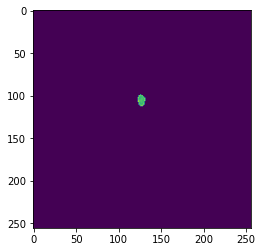

In [48]:
plt.imshow(reference_image_l1)

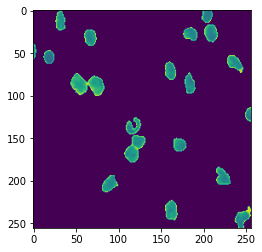

In [49]:
plt.imshow(reference_image_l2)

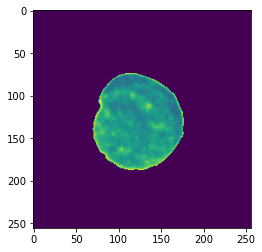

In [50]:
plt.imshow(reference_image_l3)

In [25]:
# plt.imshow(reference_image_l3)

In [26]:
def extract_and_save_best_image_segment(path,image_set_dict,set_type):
    best_image_segments=[]
    image_no=1
    
    if set_type=="training":
        path+="segmented_training_set\\"
    elif set_type=="testing":
        path+="segmented_testing_set\\"
    else:
        path+="segmented_images_new\\"
    for row in range(len(image_set_dict)):
        clusters=4
        image=image_set_dict.iloc[row]['Image']
        label=image_set_dict.iloc[row]['Cancer Stage']
        
        if label=="L1":
            clusters=6

        segmented_image=build_segmentation_model(image,clusters)
        image_segments=separate_segmented_image(clusters,image,segmented_image)

        max_similarity=-2.0
        best_image_segment=None

        reference_image=None

        if label=="L1":
            reference_image=reference_image_l1
        elif label=="L2":
            reference_image=reference_image_l2
        else:
            reference_image=reference_image_l3

        for image_segment in image_segments:
            similarity,_=ssim(reference_image,image_segment,full=True)
            if similarity>max_similarity:
                best_image_segment=image_segment
                max_similarity=similarity
                
        best_image_segments.append(best_image_segment)

        image_name = "image"+str(image_no)+".jpg"
        image_no+=1

        rgb_image_segment = cv2.cvtColor(best_image_segment,cv2.COLOR_GRAY2RGB)

        cv2.imwrite(path+label+"\\"+image_name,rgb_image_segment)
    
    return best_image_segments

In [51]:
best_image_segments_list_training = extract_and_save_best_image_segment("C:\\Users\\hp\\Desktop\\ALL_IDB Dataset\\",training_set_dict,"new_images")
# best_image_segments_list_testing = extract_and_save_best_image_segment(testing_set_dict,"testing")

In [52]:
best_image_segments_dict_training = pd.DataFrame({'Image':best_image_segments_list_training,'Cancer Stage':training_labels})
# best_image_segments_dict_testing = pd.DataFrame({'Image':best_image_segments_list_testing,'Cancer Stage':testing_labels})

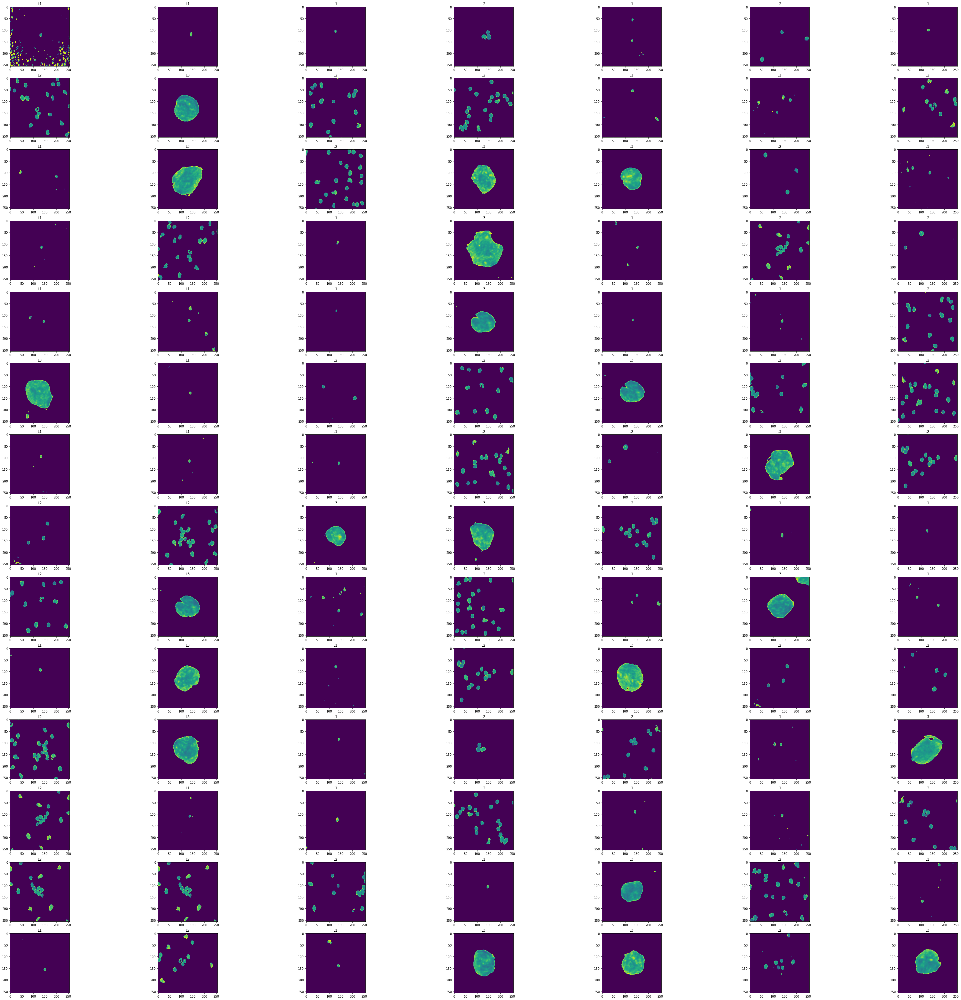

In [53]:
display_all_images(best_image_segments_dict_training)

In [54]:
def compute_noise_metric(segment):
    # Compute image variance as the noise metric
    return np.var(segment)

In [55]:
def find_segment_with_least_noise(segment_list):
    
    min_noise_segment = None
    min_noise_metric = float('inf')
    
    for idx, segment in enumerate(segment_list):
        
        noise_metric = compute_noise_metric(segment)
        
        
        if noise_metric < min_noise_metric:
            min_noise_metric = noise_metric
            min_noise_segment = segment
    
    return min_noise_segment

In [56]:
def compute_noise_metric(segment):
    
    return np.var(segment)

def find_segment_with_least_noise(segment_list):
    
    min_noise_segment = None
    min_noise_metric = float('inf')
    
   
    for idx, segment in enumerate(segment_list):
        
        noise_metric = compute_noise_metric(segment)
        
       
        if noise_metric < min_noise_metric:
            min_noise_metric = noise_metric
            min_noise_segment = segment
    
    return min_noise_segment